## Figure 4 time series of ASC and cross slope heat transport in individual bins

In [1]:
import cosima_cookbook as cc
import matplotlib.pyplot as plt
import numpy as np
import netCDF4 as nc
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import xarray as xr
import cmocean.cm as cmocean
import glob
import matplotlib.path as mpath
import matplotlib.colors as col
import pandas as pd
import scipy.stats as stats
from tqdm import tqdm
import logging
import matplotlib.cm as cm
from dask.distributed import Client
import matplotlib.colors as col
import matplotlib.gridspec as gs

logging.captureWarnings(True)
logging.getLogger('py.warnings').setLevel(logging.ERROR)

figdir = '/g/data/g40/akm157/figures/ASC_heat_trans/time_series/'

In [2]:
client = Client(memory_limit='240gb',n_workers=48)
client

2025-05-14 12:41:06,507 - distributed.nanny.memory - WARNING - Ignoring provided memory limit 240gb due to system memory limit of 125.19 GiB
2025-05-14 12:41:06,510 - distributed.nanny.memory - WARNING - Ignoring provided memory limit 240gb due to system memory limit of 125.19 GiB
2025-05-14 12:41:06,513 - distributed.nanny.memory - WARNING - Ignoring provided memory limit 240gb due to system memory limit of 125.19 GiB
2025-05-14 12:41:06,516 - distributed.nanny.memory - WARNING - Ignoring provided memory limit 240gb due to system memory limit of 125.19 GiB
2025-05-14 12:41:06,519 - distributed.nanny.memory - WARNING - Ignoring provided memory limit 240gb due to system memory limit of 125.19 GiB
2025-05-14 12:41:06,522 - distributed.nanny.memory - WARNING - Ignoring provided memory limit 240gb due to system memory limit of 125.19 GiB
2025-05-14 12:41:06,525 - distributed.nanny.memory - WARNING - Ignoring provided memory limit 240gb due to system memory limit of 125.19 GiB
2025-05-14 12

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 48
Total threads: 48,Total memory: 5.87 TiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:39355,Workers: 48
Dashboard: /proxy/8787/status,Total threads: 48
Started: Just now,Total memory: 5.87 TiB
Comm: tcp://127.0.0.1:43985,Total threads: 1
Dashboard: /proxy/42317/status,Memory: 125.19 GiB
Nanny: tcp://127.0.0.1:44261,


In [3]:
exp = '01deg_jra55v140_iaf_cycle3'
start_time= '1958-01-01'
end_time= '2018-12-31'
lat_range = slice(-90,-59)
isobath_depth = 1000

session = cc.database.create_session()

## First open u_along in density layers to use for compositing, and to show in time series:

In [6]:
# Load the along-slope velocity field for annual time series
u_along = xr.open_mfdataset('/g/data/ik11/users/wf4500/ASC_project_files/ASC_10deg_bin.nc')

# resample monthly:
u_along_da_months = u_along.resample(time='1M').mean()
u_along_da_months = u_along_da_months.sel(potrho0=slice(13.8,28.42))
u_along_da_months.load();

####################

# load monthly water mass mask:
age_mask_monthly = xr.open_mfdataset('/g/data/v45/wf4500/ASC_project_files/**_age_mask.nc')

####################

# get volume for averaging across density layers:
vol_bins = xr.open_mfdataset('/g/data/v45/wf4500/ASC_project_files/Volume_rho_10deg_bins.nc')
# select out CDW layer:
CDW_volume = age_mask_monthly.CDW_mask*vol_bins.volume

# do volume-weighted density average and annual averaging:
def vol_ave_potrho0_potmask(quantity,CDW_volume):
    return (quantity * CDW_volume).sum('potrho0')/CDW_volume.sum('potrho0')

U_along_annual_binned_CDW_volav = vol_ave_potrho0_potmask(u_along_da_months.U,CDW_volume).groupby('time.year').mean('time')
U_along_annual_binned_CDW_volav = U_along_annual_binned_CDW_volav.load()

annual_CDW_vol = CDW_volume.sum('potrho0').groupby('time.year').mean('time').load()

# Need to multiply by daily mask before taking climatology

In [9]:
# Load the along-slope velocity field, seasonal climatology using daily data
# NEED THIS AS TIME SERIES NOT CLIMATOLOGY:
u_along = xr.open_mfdataset('/g/data/x77/wf4500/ASC_project/ASC_sigma_daily_10deg/OM2_01_iaf_cycle3/U_daily_10deg_****-**.nc')
####################

# load daily climatology water mass mask:
age_mask_daily = xr.open_mfdataset('/g/data/x77/wf4500/ASC_project/age_mask_daily/OM2_01_iaf_cycle3/CDW_****-**.nc')

####################

# get volume for averaging across density layers:
# NEED THIS AS TIME SERIES NOT CLIMATOLOGY:
vol_bins = xr.open_mfdataset('/g/data/x77/wf4500/ASC_project/volume_daily_10deg/OM2_01_iaf_cycle3/VOL*.nc')
# select out CDW layer:
CDW_volume = age_mask_daily.CDW_mask*vol_bins.Volume

# do volume-weighted density average:
def vol_ave_potrho0_potmask(quantity,CDW_volume):
    return (quantity * CDW_volume).sum('potrho0')/CDW_volume.sum('potrho0')

U_along_clima_binned_CDW_volav = vol_ave_potrho0_potmask(u_along,CDW_volume)

# compute seasonal climatology:
U_along_clima_binned_CDW_volav = U_along_clima_binned_CDW_volav.groupby('time.dayofyear').mean('time')

U_along_clima_binned_CDW_volav = U_along_clima_binned_CDW_volav.load()

clima_CDW_vol = (vol_bins.Volume*age_mask_daily.CDW_mask).sum('potrho0').groupby('time.dayofyear').mean('time').load()

/g/data/xp65/public/apps/med_conda/envs/analysis3-24.07/lib/python3.11/site-packages/dask/_task_spec.py:651: RuntimeWarning: invalid value encountered in divide
  return self.func(*new_argspec)


## Then open CSHT in density layers for time series:

In [12]:
# Load CSHT field annual
CSHT_along = xr.open_mfdataset('/g/data/hh5/tmp/access-om/fbd581/ASC_project/Lon_binning/CSHT_ZC_potrho0_10degBins.nc')

# resample monthly:
CSHT_along_monthly = CSHT_along.resample(time='1M').mean()

# apply age mask to select out CDW layer:
CSHT_months_binned_CDW = (age_mask_monthly.CDW_mask * CSHT_along_monthly)

# annual averaging and sum over layers:
CSHT_annual_binned_CDW = CSHT_months_binned_CDW.groupby('time.year').mean('time').sum(dim = 'potrho0')

# Need to multiply by daily mask before taking climatology

In [13]:
# climatological averaging:
CSHT_along_daily = CSHT_along

# apply age mask to select out CDW layer:
CSHT_months_binned_CDW = (age_mask_daily.CDW_mask * CSHT_along_daily)

# sum over layers:
CSHT_clima_binned_CDW = CSHT_months_binned_CDW.sum(dim = 'potrho0')

# compute seasonal climatology:
CSHT_clima_binned_CDW = CSHT_clima_binned_CDW.groupby('time.dayofyear').mean('time')
CSHT_clima_binned_CDW = CSHT_clima_binned_CDW.load()

## Plot interannual and seasonal time series for all regions

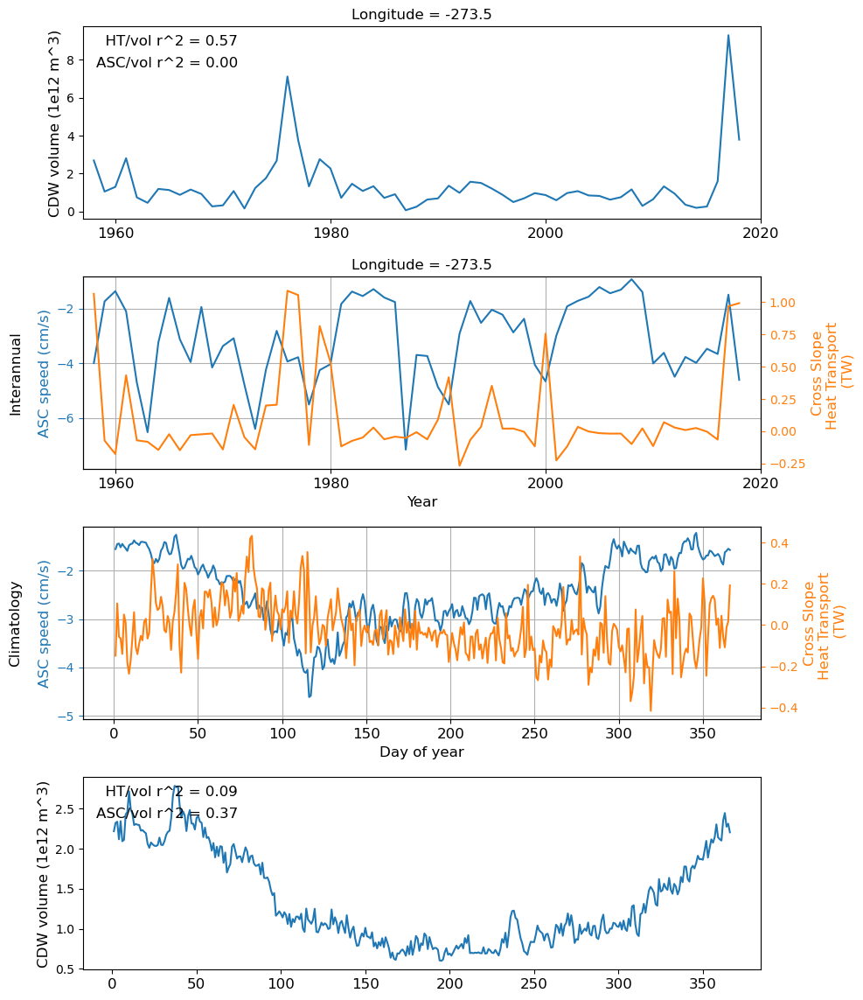

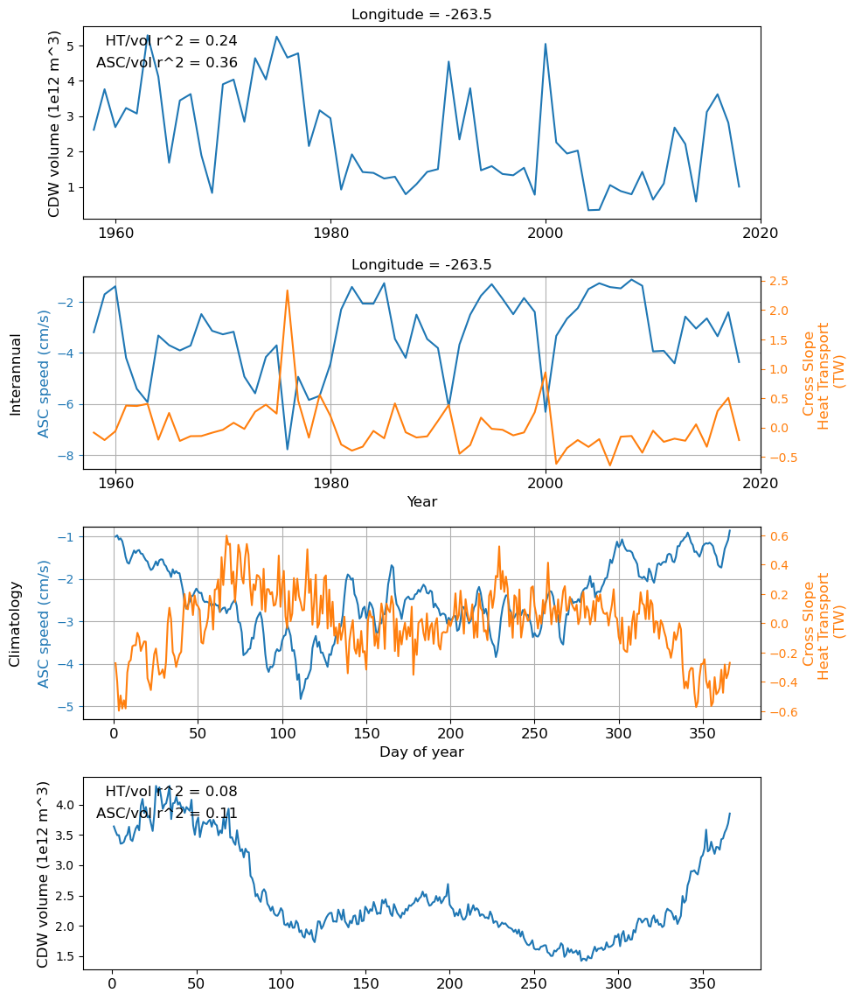

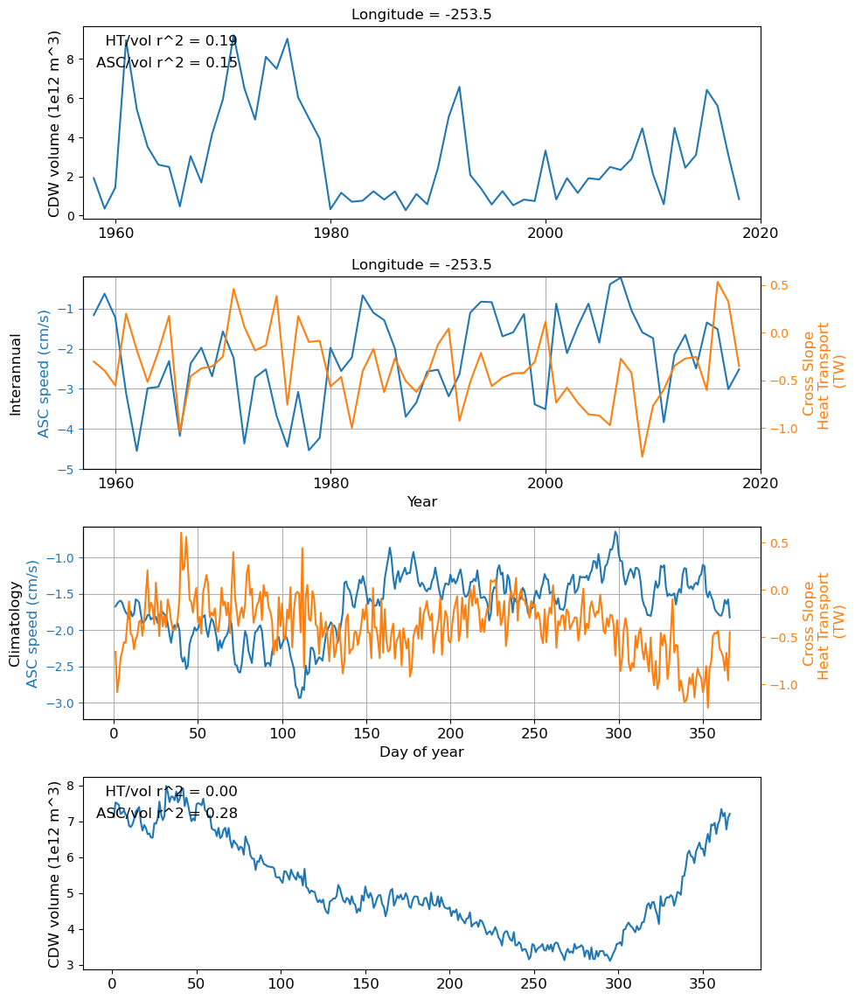

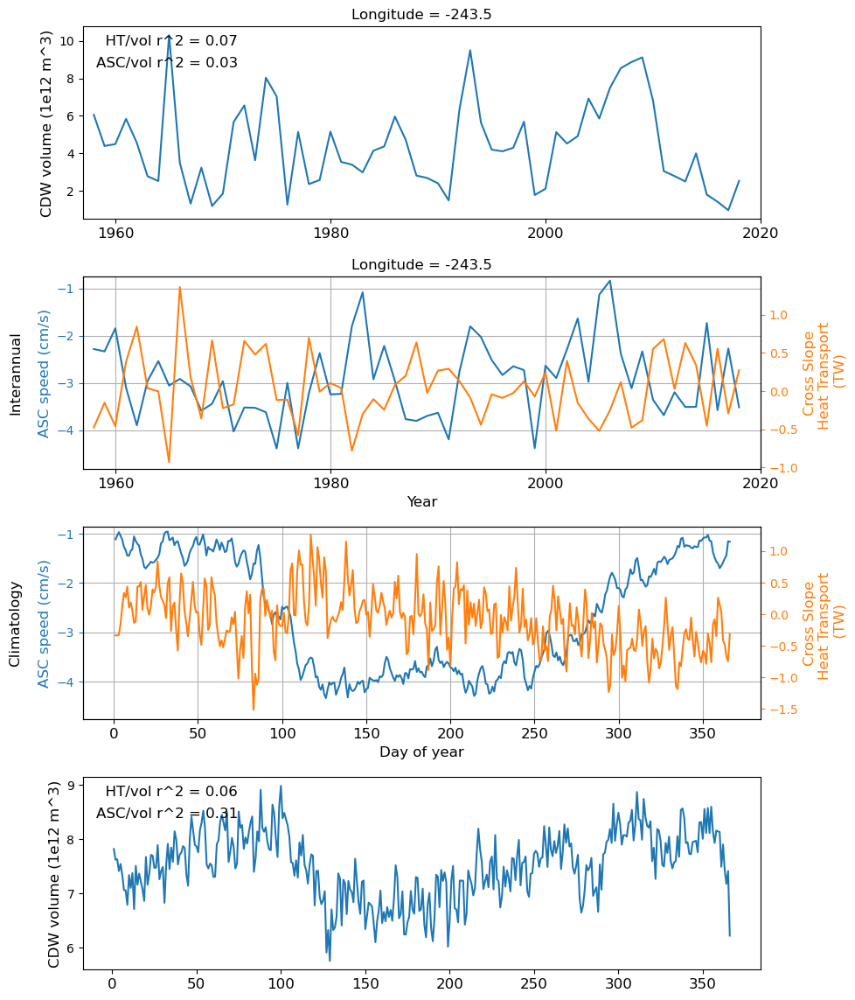

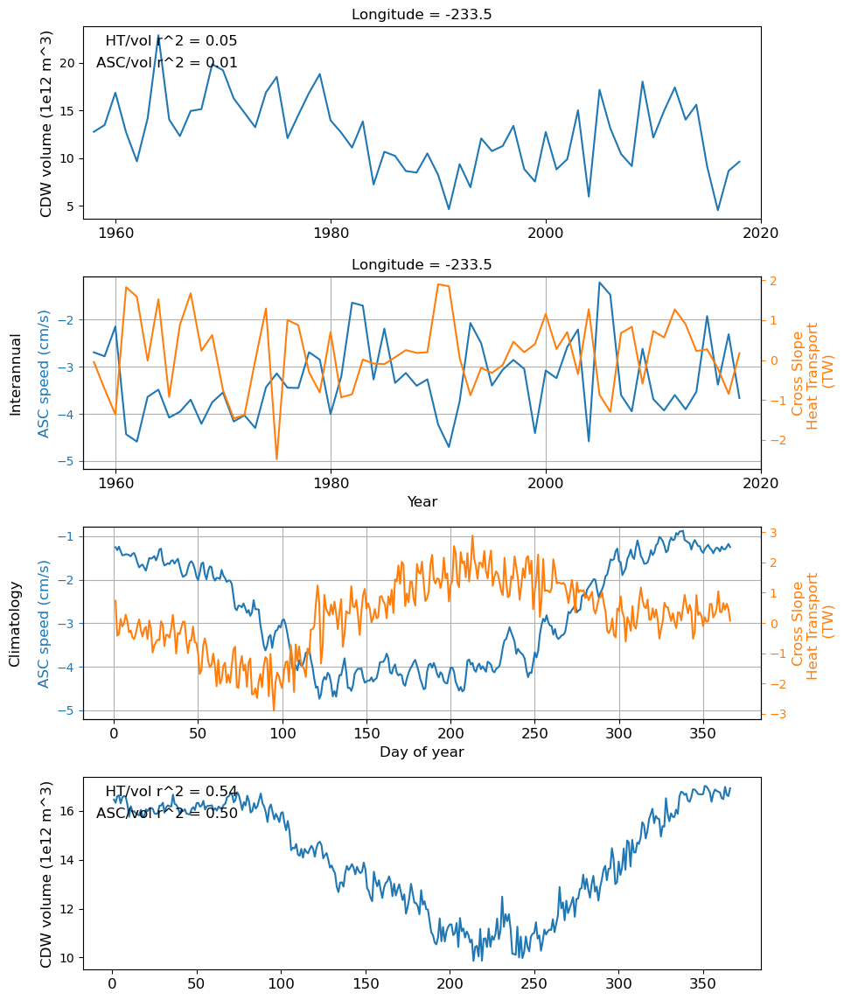

...

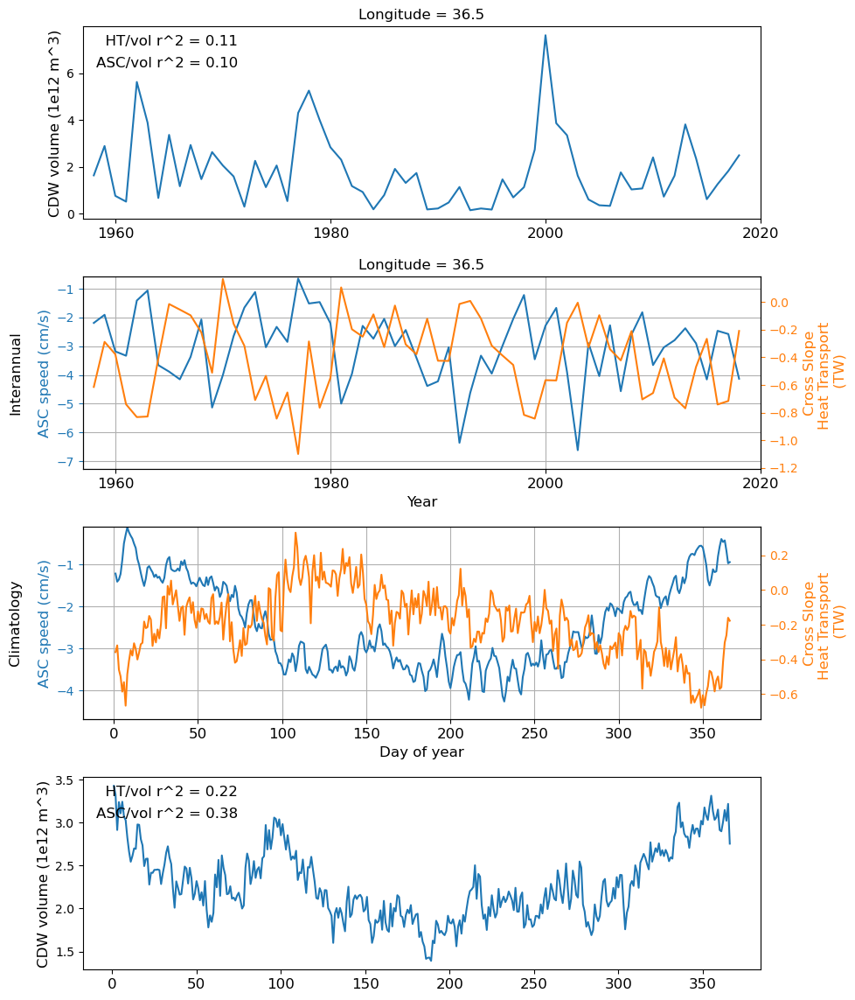

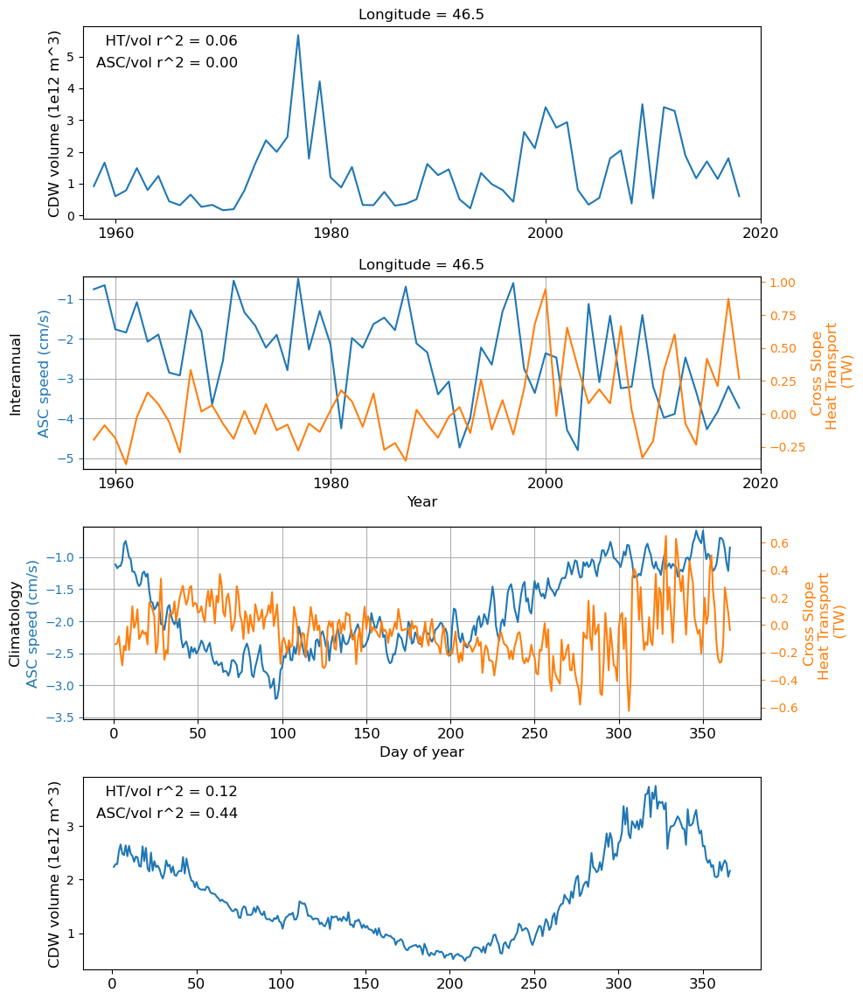

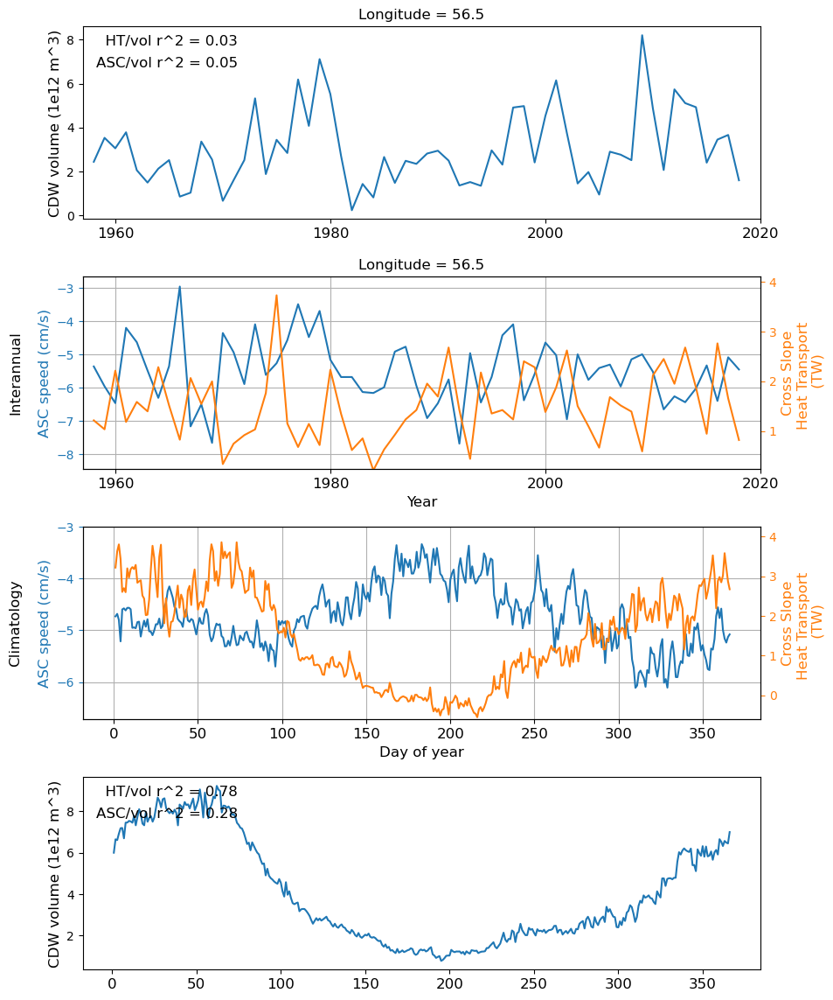

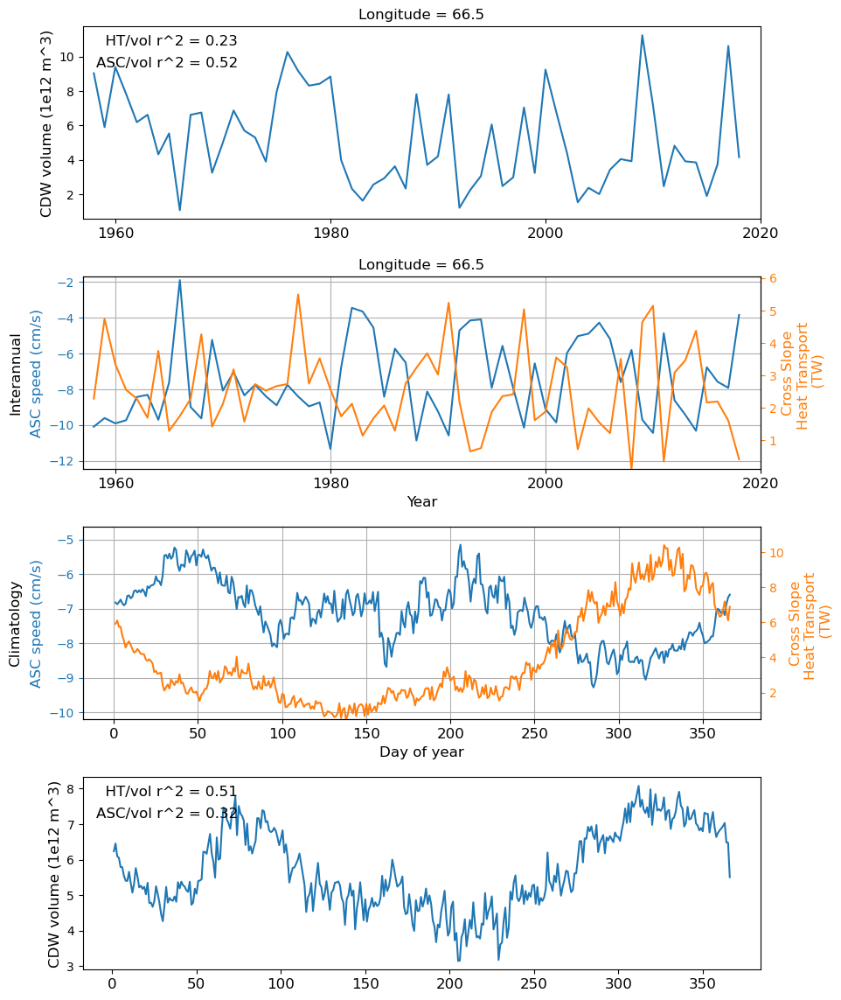

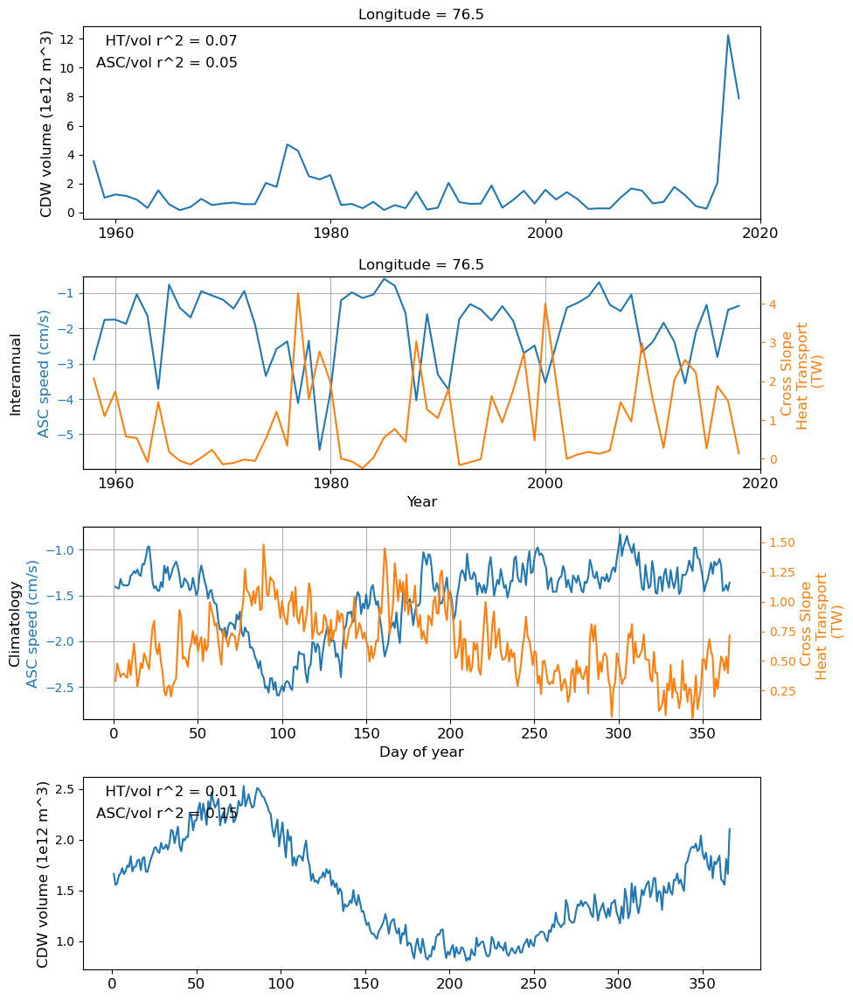

In [19]:
fontsize=12

longitude_slices = U_along_annual_binned_CDW_volav.lon_bins

for long in range(len(longitude_slices)):
    #long = 0
    
    fig = plt.figure(figsize=(10, 14))
    
    # Create a GridSpec for a 3x4 grid
    grid = gs.GridSpec(nrows=4, ncols=1, figure=fig)
    grid.update(hspace=0.3, wspace=0.95)  # Adjust vertical and horizontal spacing
    
    # Initialize a list to store axes
    axes = []
    
    ax1 = fig.add_subplot(grid[0, 0])
    ax2 = fig.add_subplot(grid[3, 0])
    ax3 = fig.add_subplot(grid[1, 0])
    ax4 = fig.add_subplot(grid[2, 0])

    # Annual CDW volume time series:
    ax1.plot(U_along_annual_binned_CDW_volav.year,annual_CDW_vol.sel(lon_bins=longitude_slices[long])/1e12)
    ax1.set_xlim(1957,2020)
    ax1.set_ylabel('CDW volume (1e12 m^3)',fontsize=fontsize)#,color='tab:blue')
    ax1.set_xticks(ticks=np.arange(1960,2021,20),labels=np.arange(1960,2021,20), fontsize=fontsize)
    ax1.set_title('Longitude = '+str(longitude_slices[long].data))
    
    # add r^2 values with volume:
    rsq_annual = stats.linregress(U_along_annual_binned_CDW_volav.sel(lon_bins=longitude_slices[long]), annual_CDW_vol.sel(lon_bins=longitude_slices[long])).rvalue**2
    ax1.text(0.02,0.79,'ASC/vol r^2 = '+'{0:.2f}'.format(rsq_annual), fontsize=fontsize, transform=ax1.transAxes)
    rsq_annual = stats.linregress(CSHT_annual_binned_CDW.CSHT_ZC_lon_binned.sel(lon_bins=longitude_slices[long]), annual_CDW_vol.sel(lon_bins=longitude_slices[long])).rvalue**2
    ax1.text(0.02,0.9,'  HT/vol r^2 = '+'{0:.2f}'.format(rsq_annual), fontsize=fontsize, transform=ax1.transAxes)

    # Seasonal climatology CDW volume time series:
    ax2.plot(U_along_clima_binned_CDW_volav.dayofyear,clima_CDW_vol.sel(lon_bins=longitude_slices[long])/1e12)
    #ax2.set_xlim(1957,2020)
    ax2.set_ylabel('CDW volume (1e12 m^3)',fontsize=fontsize)#,color='tab:blue')
    ax2.set_xticks(ticks=np.arange(0,365,50),labels=np.arange(0,365,50), fontsize=fontsize)

    # add r^2 values with volume:
    rsq_annual = stats.linregress(U_along_clima_binned_CDW_volav.U.sel(lon_bins=longitude_slices[long]), clima_CDW_vol.sel(lon_bins=longitude_slices[long])).rvalue**2
    ax2.text(0.02,0.79,'ASC/vol r^2 = '+'{0:.2f}'.format(rsq_annual), fontsize=fontsize, transform=ax2.transAxes)
    rsq_annual = stats.linregress(CSHT_clima_binned_CDW.CSHT_ZC_lon_binned.sel(lon_bins=longitude_slices[long]), clima_CDW_vol.sel(lon_bins=longitude_slices[long])).rvalue**2
    ax2.text(0.02,0.9,'  HT/vol r^2 = '+'{0:.2f}'.format(rsq_annual), fontsize=fontsize, transform=ax2.transAxes)

    ###################

    ax3_HT=ax3.twinx()
    ax3.plot(U_along_annual_binned_CDW_volav.year,U_along_annual_binned_CDW_volav.sel(lon_bins=longitude_slices[long])*100,label='ASC')
    ax3.plot([1956,2024],[0,0],\
             linestyle='--',color='black')
    ax3_HT.plot(U_along_annual_binned_CDW_volav.year,(CSHT_annual_binned_CDW.CSHT_ZC_lon_binned.sel(lon_bins=longitude_slices[long])/1e12),\
                label='CSHT',color='tab:orange')
    ax3_HT.set_ylim((CSHT_annual_binned_CDW.CSHT_ZC_lon_binned.sel(lon_bins=longitude_slices[long]).min().values/1e12*1.1),
                    CSHT_annual_binned_CDW.CSHT_ZC_lon_binned.sel(lon_bins=longitude_slices[long]).max().values/1e12*1.1)
    # ax3.set_yticks([-3,-2,-1,0,1,2,3],labels=[-3,-2,-1,0,1,2,3],fontsize=14,color='tab:blue')
    ax3.set_ylabel('ASC speed (cm/s)',fontsize=fontsize,color='tab:blue')
    ax3.set_ylim(U_along_annual_binned_CDW_volav.sel(lon_bins=longitude_slices[long]).min().values*100*1.1,
                    U_along_annual_binned_CDW_volav.sel(lon_bins=longitude_slices[long]).max().values*100*.9)
    # ax3_HT.set_yticks([-10,-5,0,5,10],labels=[-10,-5,0,5,10],fontsize=14,color='tab:orange')
    ax3_HT.set_ylabel('Cross Slope\nHeat Transport \n (TW)',fontsize=fontsize,color='tab:orange')
    
    ax3.set_xticks(ticks=np.arange(1960,2021,20),labels=np.arange(1960,2021,20), fontsize=fontsize)
    ax3.grid()
    ax3.set_xlim(1957,2020)
    ax3.set_xlabel('Year',fontsize=fontsize)
    ax3.tick_params(axis='y', colors='tab:blue')  # Left y-axis ticks and labels in blue
    ax3_HT.tick_params(axis='y', colors='tab:orange')  # Right y-axis ticks and labels in orange
    
    ################
    
    ax4_HT=ax4.twinx()
    ax4.plot(U_along_clima_binned_CDW_volav.dayofyear,U_along_clima_binned_CDW_volav.U.sel(lon_bins=longitude_slices[long])*100,label='ASC')
    ax4.plot([0,12],[0,0],\
             linestyle='--',color='black')
    ax4_HT.plot(U_along_clima_binned_CDW_volav.dayofyear,(CSHT_clima_binned_CDW.CSHT_ZC_lon_binned.sel(lon_bins=longitude_slices[long])/1e12),\
                label='CSHT',color='tab:orange')
    ax4_HT.set_ylim((CSHT_clima_binned_CDW.CSHT_ZC_lon_binned.sel(lon_bins=longitude_slices[long]).min().values/1e12)*1.1,
                    (CSHT_clima_binned_CDW.CSHT_ZC_lon_binned.sel(lon_bins=longitude_slices[long]).max().values/1e12)*1.1)
    ax4.set_ylim()
    # ax3.set_yticks([-3,-2,-1,0,1,2,3],labels=[-3,-2,-1,0,1,2,3],fontsize=14,color='tab:blue')
    ax4.set_ylabel('ASC speed (cm/s)',fontsize=fontsize,color='tab:blue')
    # ax3_HT.set_ylim(CSHT_lims[i])
    # ax3_HT.set_yticks([-10,-5,0,5,10],labels=[-10,-5,0,5,10],fontsize=14,color='tab:orange')
    ax4_HT.set_ylabel('Cross Slope\nHeat Transport \n (TW)',fontsize=fontsize,color='tab:orange')
    ax4.set_xlabel('Day of year',fontsize=fontsize)
    # ax4.set_xticks(ticks=np.arange(1960,2021,10),labels=np.arange(1960,2021,10), fontsize=14)
    ax4.set_xticks(ticks=np.arange(0,365,50),labels=np.arange(0,365,50), fontsize=fontsize)
    #ax4.set_xlim(1,12)
    ax4.set_ylim(U_along_clima_binned_CDW_volav.U.sel(lon_bins=longitude_slices[long]).min().values*100*1.1,
                    U_along_clima_binned_CDW_volav.U.sel(lon_bins=longitude_slices[long]).max().values*100*.9)
    ax4.grid()
    # Set tick colors
    ax4.tick_params(axis='y', colors='tab:blue')  # Left y-axis ticks and labels in blue
    ax4_HT.tick_params(axis='y', colors='tab:orange')  # Right y-axis ticks and labels in orange
    
    ax3.text(-0.1,0.5, 'Interannual', fontsize=fontsize, transform = ax3.transAxes, va = 'center', ha = 'center', rotation = 90)
    ax4.text(-0.1,0.5, 'Climatology', fontsize=fontsize, transform = ax4.transAxes, va = 'center', ha = 'center', rotation = 90)
    
    ax3.set_title('Longitude = '+str(longitude_slices[long].data))
    plt.tight_layout()
    figure_path = figdir+'time_series_'+str(longitude_slices[long].data)+'.png'
    plt.savefig(figure_path , dpi=300,bbox_inches='tight', pad_inches=0.1,facecolor='white')
    # Show the plots
    plt.show()